# Lab. Filters and Edges

At the end of this laboratory, you would get familiarized with

*   Convolution
*   Image Filters
*   Edge detection
---

In [39]:
# Loading necessary libraries (Feel free to add new libraries if you need for any computation)

import numpy as np
import cv2
from matplotlib import pyplot as plt
from skimage import color, data, exposure, feature, filters, io, morphology, util
from scipy.ndimage import convolve, uniform_filter, median_filter
from skimage.filters import gaussian, median
from skimage.morphology import disk, square, rectangle, diamond
from skimage.util import random_noise


# Convolution
Hint: 
*   *convolve function is available in scipy.ndimage module*
*   The mask has to be normalized before convolving with the image

### Exercise:
*   Read 'camera' image from the data module
*   Convolve the image with a horizontal mask:  (1 x 15) with all values set to ones


In [23]:
# solution
camera_image = data.camera()

#Mask with all values set to ones
horizontal_mask = np.ones((1,15))

#Convolving the image with the horizontal mask
convolved_image = convolve(camera_image, horizontal_mask)


*   Convolve the image with a vertical mask:  (15 x 1) with all values set to ones

In [24]:
# solution
vertical_mask = np.ones((15,1))

convolved_image_vertical = convolve(camera_image, vertical_mask)

*   Convolve the image with a 2D mask:  (15 x 15) with all values set to ones

In [25]:
# solution
mask_2d = np.ones((15,15))

convolved_mask_2d = convolve(camera_image, mask_2d)

*   Visualize the original image, horizontal convolution, vertical convolution, 2D convolution using matplotlib subplot.

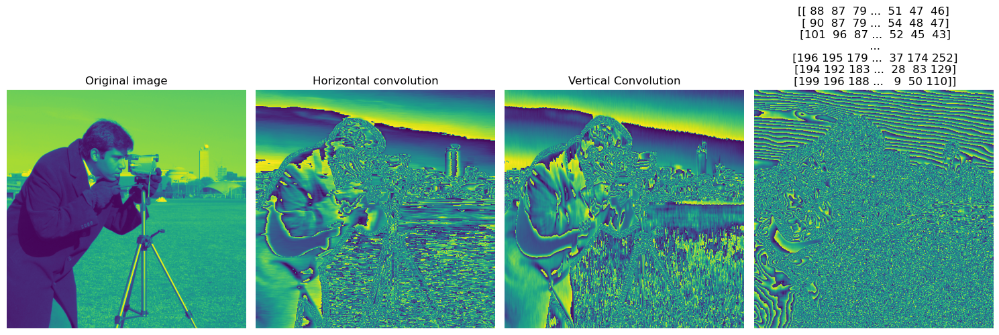

In [26]:
# solution
plt.figure(figsize=(15,5))

#original image
plt.subplot(1,4,1)
plt.imshow(camera_image)
plt.title('Original image')
plt.axis('off')

#horizontal convolution
plt.subplot(1,4,2)
plt.imshow(convolved_image)
plt.title('Horizontal convolution')
plt.axis('off')

#vertical convolution
plt.subplot(1,4,3)
plt.imshow(convolved_image_vertical)
plt.title('Vertical Convolution')
plt.axis('off')

#2d convolution
plt.subplot(1,4,4)
plt.imshow(convolved_mask_2d)
plt.title(convolved_mask_2d)
plt.axis('off')

plt.tight_layout()
plt.show()

*   Apply 2 stage convolution: Horizontal mask (1 x 15) with all values set to 1 followed by vertical mask (15 x 1) with all values set to 1
*   Visualize the original image, 2D convolved image, 2 stage convolved image using matplotlib subplot.


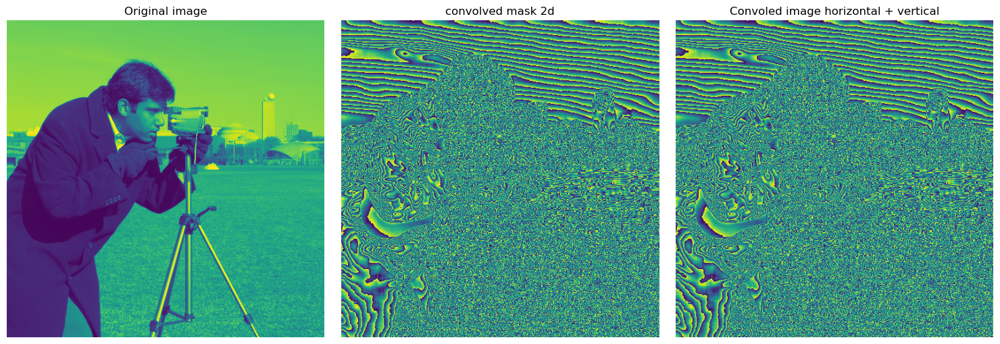

In [27]:
# solution

#Mask with all values set to ones
horizontal_mask = np.ones((1,15))

#Convolving the image with the horizontal mask
convolved_image = convolve(camera_image, horizontal_mask)

# solution
vertical_mask = np.ones((15,1))
convolved_image_ver_hor = convolve(convolved_image, vertical_mask)

plt.figure(figsize=(15,5))

#original image
plt.subplot(1,3,1)
plt.imshow(camera_image)
plt.title('Original image')
plt.axis('off')

#2d convolution
plt.subplot(1,3,2)
plt.imshow(convolved_mask_2d)
plt.title('convolved mask 2d')
plt.axis('off')

#vertical/horizontal convolution
plt.subplot(1,3,3)
plt.imshow(convolved_image_ver_hor)
plt.title('Convoled image horizontal + vertical')
plt.axis('off')

plt.tight_layout()
plt.show()

*   Is the result different from applying convolution with 2D mask (15 x 15) with all values set to 1?

**Solution**

*(Double-click or enter to edit)*

NO

# Image Blurring

*   Why is blurring important?



**Solution**

*(Double-click or enter to edit)*

To make the colour transition from one side of an edge in the image to another smooth rather tha sudden

### Exercise: Gaussian Filter
*   Read 'astronaut' image from the data module
*   Convert the image to grayscale.
*   Apply a gaussian filter with sigma=1
*   Hint: *gaussian function is available in skimage.filters module*

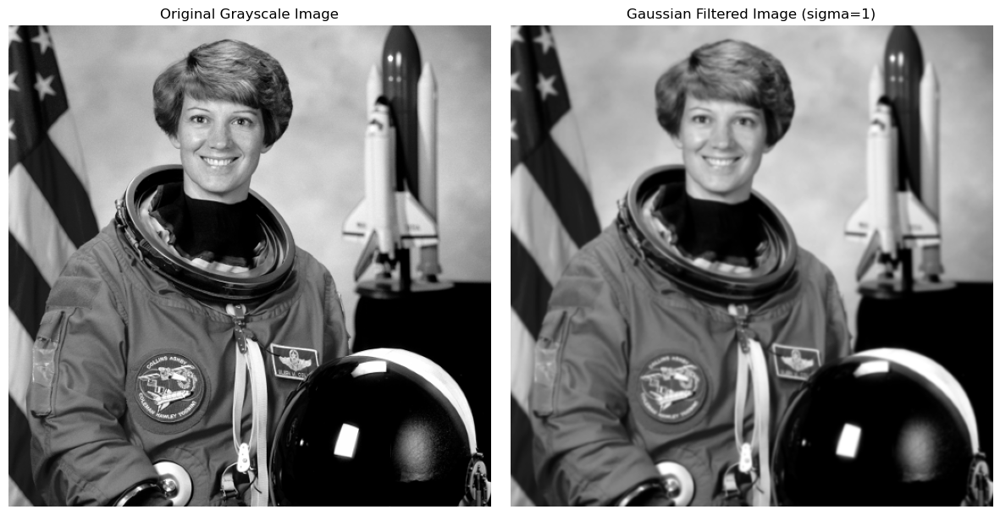

In [28]:
# solution
astronaut = data.astronaut()

#Converting to grayscale
astronaut_gray = cv2.cvtColor(astronaut, cv2.COLOR_BGR2GRAY)

gaussian_filter = filters.gaussian(astronaut_gray, sigma=1)

# Display the original and filtered images
plt.figure(figsize=(12, 6))

# Original grayscale image
plt.subplot(1, 2, 1)
plt.imshow(astronaut_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

# Gaussian filtered image
plt.subplot(1, 2, 2)
plt.imshow(gaussian_filter, cmap='gray')
plt.title('Gaussian Filtered Image (sigma=1)')
plt.axis('off')

plt.tight_layout()
plt.show()

*   Apply a gaussian filter with sigma=0. What is the result of this operation?

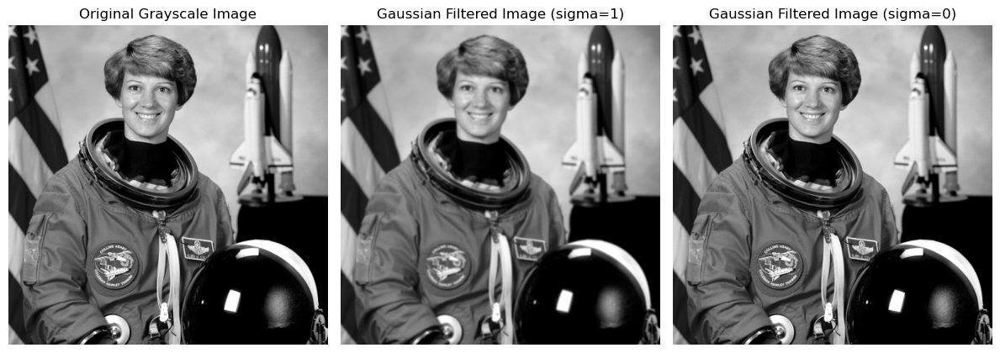

In [29]:
# solution

gaussian_filter_ = filters.gaussian(astronaut_gray, sigma=0)

# Display the original and filtered images
plt.figure(figsize=(12, 6))

# Original grayscale image
plt.subplot(1, 3, 1)
plt.imshow(astronaut_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

# Gaussian filtered image
plt.subplot(1, 3, 2)
plt.imshow(gaussian_filter, cmap='gray')
plt.title('Gaussian Filtered Image (sigma=1)')
plt.axis('off')

# Gaussian filtered image 2
plt.subplot(1, 3, 3)
plt.imshow(gaussian_filter_, cmap='gray')
plt.title('Gaussian Filtered Image (sigma=0)')
plt.axis('off')

plt.tight_layout()
plt.show()

*   Vary the value of sigma in the gaussian filter. Apply sigma=0.25, 0.5, 1, 1.5, 2, 5
*   Visualize the different results using matplotlib subplot.

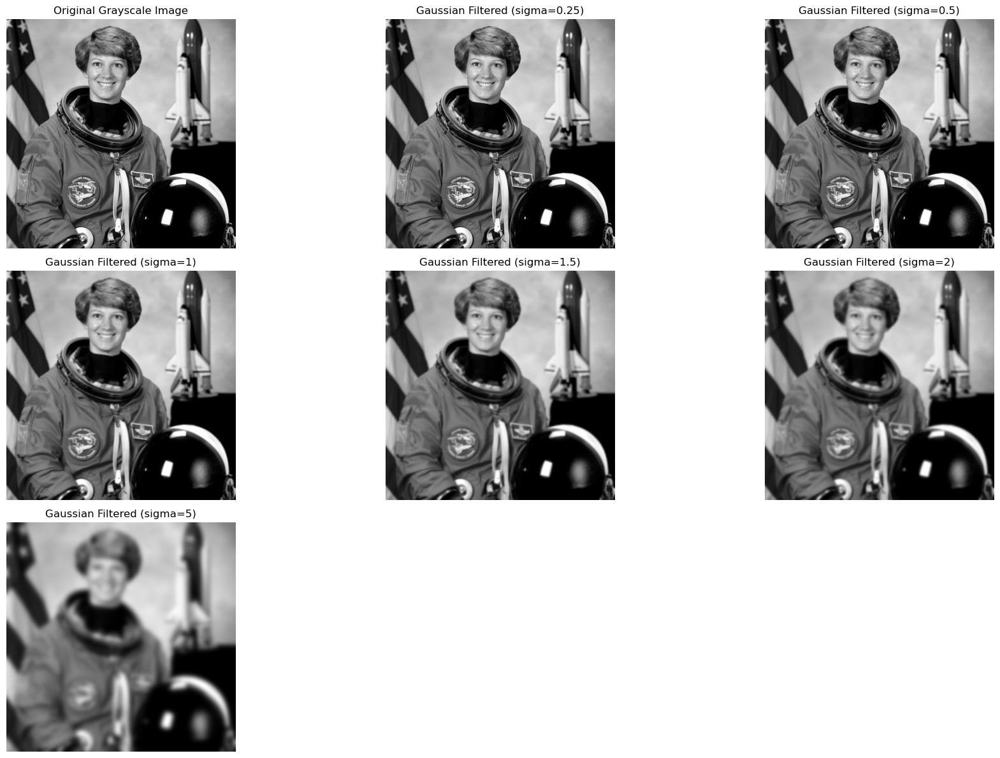

In [30]:
# solution
sigma_values = [0.25, 0.5, 1, 1.5, 2, 5]

filtered_images = [filters.gaussian(astronaut_gray, sigma=sigma) for sigma in sigma_values]

# Plot the original and filtered images
plt.figure(figsize=(18, 12))

# Original grayscale image
plt.subplot(3, 3, 1)
plt.imshow(astronaut_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

for i, (sigma, filtered_image) in enumerate(zip(sigma_values, filtered_images), start=2):
    plt.subplot(3,3,i)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(f'Gaussian Filtered (sigma={sigma})')
    plt.axis('off')

plt.tight_layout()
plt.show()


*    What happens when a larger sigma value is used and what happens when a smaller sigma value is used in the gaussian filter?
*    What determines the optimal sigma value?




**Solution**

*(Double-click or enter to edit)*

The bigger the sigma, the higher the noise and blur and loos of details
The better sigma value would be the lower one, where the smoothing is very light and low detail loss 

### Exercise: Median Filter
*   Convert the 'astronauts' image to grayscale
*   Apply median filter with a disk structuring element of radius 1, 5, 10
*   Visualize the original image and the filtered image matplotlib subplot.

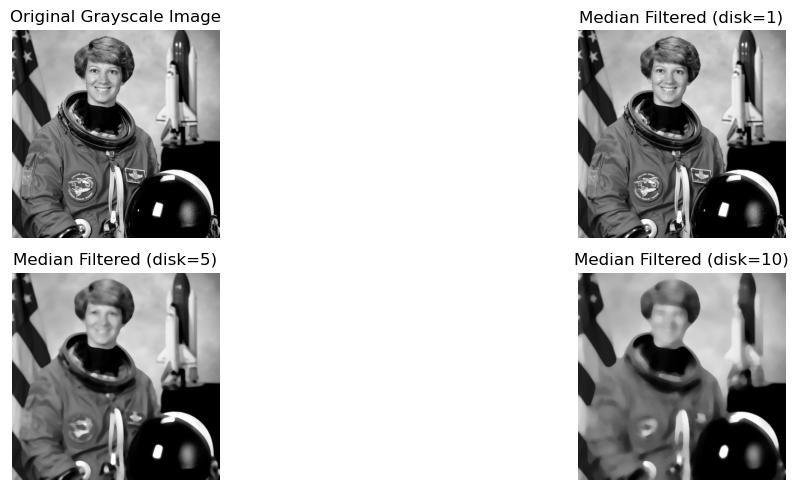

In [31]:
# solution
#Converting to grayscale
astronaut_gray = cv2.cvtColor(astronaut, cv2.COLOR_BGR2GRAY)

# Define a disk structuring element (selem) of radius 1,5,10
radius = [1,5,10]
filtered_images = [median(astronaut_gray, disk(radius_)) for radius_ in radius]


# Plot the original and filtered images
plt.figure(figsize=(15, 5))

# Original grayscale image
plt.subplot(2, 2, 1)
plt.imshow(astronaut_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

for i, (radius_, filtered_image) in enumerate(zip(radius, filtered_images), start=2):
    plt.subplot(2,2,i)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(f'Median Filtered (disk={radius_})')
    plt.axis('off')

plt.tight_layout()
plt.show()

*   Change the structuring element to square, rectangle and diamond
*   Visualize the original image and the filtered image using matplotlib

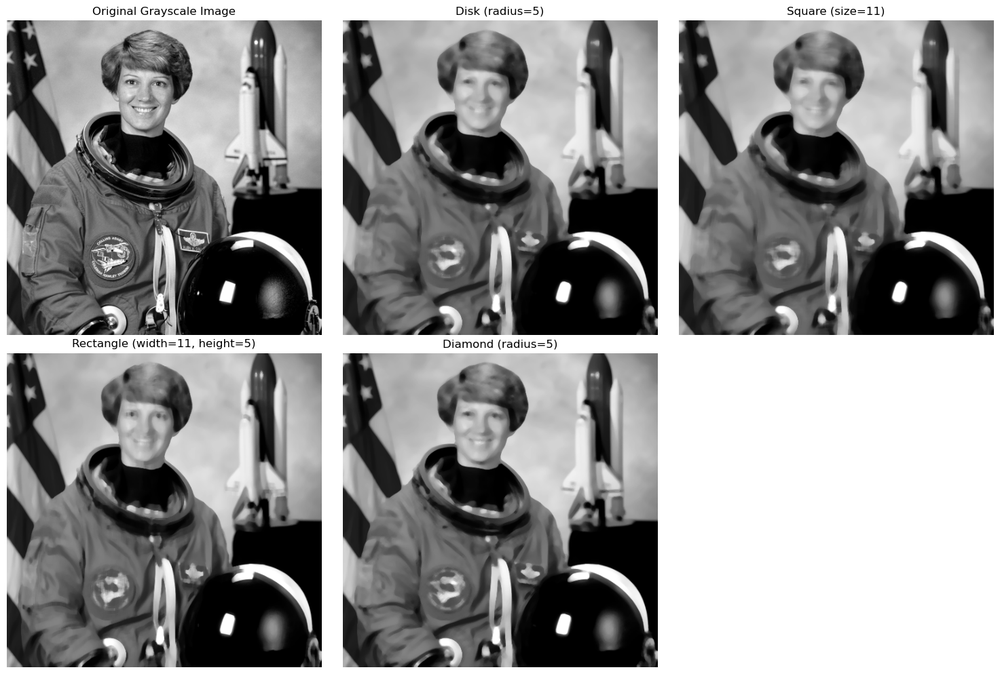

In [32]:
# solution
# Change the structuring element to square, rectangle and diamond
selems = {
    "Disk (radius=5)": disk(5),
    "Square (size=11)": square(11),
    "Rectangle (width=11, height=5)": rectangle(11, 5),
    "Diamond (radius=5)": diamond(5)
}
filtered_images = {name: median(astronaut_gray, selem) for name, selem in selems.items()}

# Plot the original and filtered images
plt.figure(figsize=(15, 10))

# Original grayscale image
plt.subplot(2, 3, 1)
plt.imshow(astronaut_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

# Filtered images with different structuring elements
for i, (name, filtered_image) in enumerate(filtered_images.items(), start=2):
    plt.subplot(2, 3, i)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(name)
    plt.axis('off')

plt.tight_layout()
plt.show()


*   What is the effect of the structuring element on the median filter?


**Solution**

*(Double-click or enter to edit)*

all reduce noise by replacing central pixels value with the media of neighboring pixels. Disk and diamonf preserve more edges and finer details compared to square and rectangular shapes

*   What is the difference between gaussian filter, mean filter and median filter?
*   Provide an example where each one would be used.


**Solution**

*(Double-click or enter to edit)*

Gaussian filter applies blur to the image reducing the noise. the mean filter smooths the image and the median filter preserves edges and finer details

### Exercise: Effect of noise

It is easy to add noise to an image using the random_noise function available in skimage.util

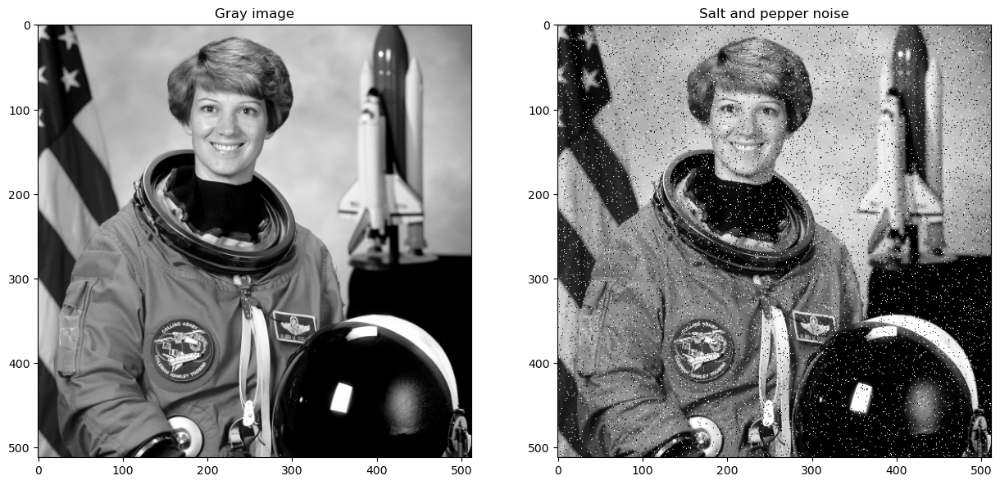

In [37]:
from skimage.util import random_noise
image = data.astronaut()
image = color.rgb2gray(image)

img_noise = random_noise(image, mode='s&p')  # salt and pepper noise is added

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(15, 7))

ax[0].imshow(image, cmap='gray')
ax[0].set_title('Gray image')
ax[1].imshow(img_noise, cmap='gray')
ax[1].set_title('Salt and pepper noise')

plt.show()

*   Create noisy images with **gaussian** noise and **salt and pepper** noise.
*   Apply mean filter, median filter and gaussian filter in each of the noisy images.
*   Visualize the images and observe the difference in each filter with respect to the noise.

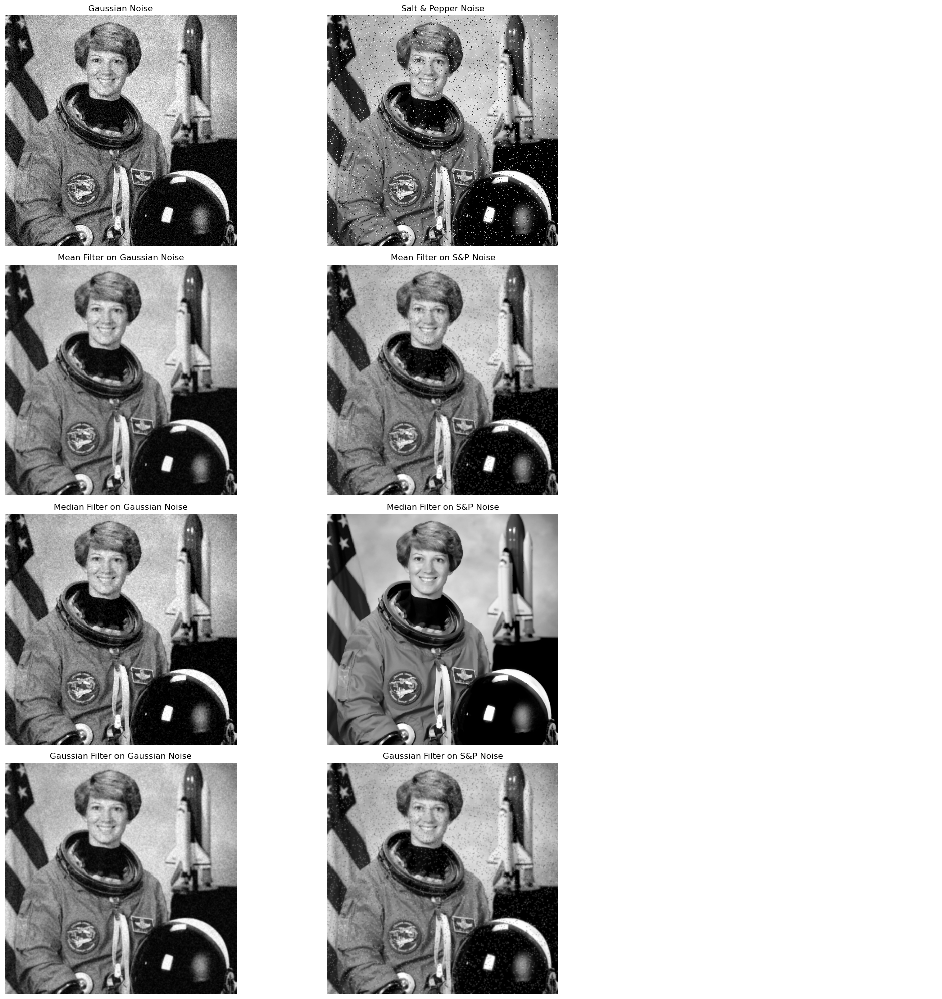

In [41]:
# solution
image = data.astronaut()
image = color.rgb2gray(image)

# Gaussian noise
gaussian_noise = random_noise(image, mode='gaussian')

# salt and pepper noise
s_p_noise_img = random_noise(image, mode='s&p')

# mean filter
mean_filter_gaussian = uniform_filter(gaussian_noise, size=3)
mean_filter_s_p = uniform_filter(s_p_noise_img, size=3)

# Apply median filter
median_filter_gaussian = median_filter(gaussian_noise, size=3)
median_filter_s_p = median_filter(s_p_noise_img, size=3)

# Apply Gaussian filter
gaussian_filter_gaussian = gaussian(gaussian_noise, sigma=1)
gaussian_filter_s_p = gaussian(s_p_noise_img, sigma=1)

# Plot the results
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 20))

# Original noisy images
axes[0, 0].imshow(gaussian_noise, cmap='gray')
axes[0, 0].set_title('Gaussian Noise')
axes[0, 1].imshow(s_p_noise_img, cmap='gray')
axes[0, 1].set_title('Salt & Pepper Noise')

# Mean filter results
axes[1, 0].imshow(mean_filter_gaussian, cmap='gray')
axes[1, 0].set_title('Mean Filter on Gaussian Noise')
axes[1, 1].imshow(mean_filter_s_p, cmap='gray')
axes[1, 1].set_title('Mean Filter on S&P Noise')

# Median filter results
axes[2, 0].imshow(median_filter_gaussian, cmap='gray')
axes[2, 0].set_title('Median Filter on Gaussian Noise')
axes[2, 1].imshow(median_filter_s_p, cmap='gray')
axes[2, 1].set_title('Median Filter on S&P Noise')

# Gaussian filter results
axes[3, 0].imshow(gaussian_filter_gaussian, cmap='gray')
axes[3, 0].set_title('Gaussian Filter on Gaussian Noise')
axes[3, 1].imshow(gaussian_filter_s_p, cmap='gray')
axes[3, 1].set_title('Gaussian Filter on S&P Noise')

# Hide any empty subplots
for ax in axes.flatten():
    ax.axis('off')

plt.tight_layout()
plt.show()


*   Which filter works better for gaussian noise and which filter works better for salt and pepper noise? Explain your choice of the filter for that particular type of noise.


**Solution**

*(Double-click or enter to edit)*

For Gaussian noise, the Gaussian filter is the best choice because it effectively reduces noise while preserving edges.
For salt and pepper noise, the median filter is the best choice because it removes the noise effectively without blurring the image.

# Image Sharpening

A sharpening filter can be broken down into two steps: It takes a smoothed image, subtracts it from the original image to obtain the "details" of the image, and adds the "details" to the original image.

enhanced image = original + amount * (original - blurred)

### Exercise:
*   Read 'moon' image from the data module
*   Perform smoothing using a gaussian filter of sigma 1
*   Subtract the smoothened image from the original image.
*   Enhance the image with amount=1
*   Visualize each of the steps using matplotlib

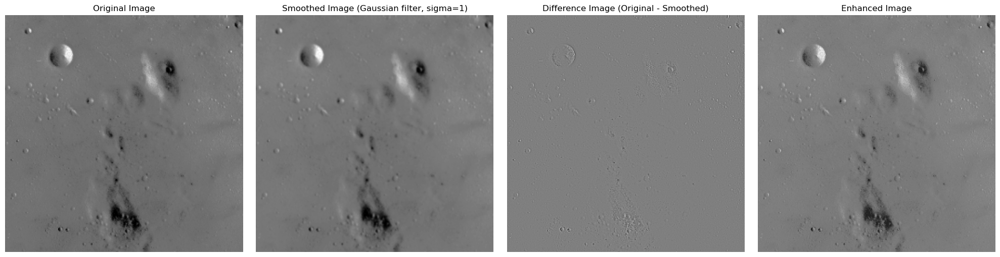

In [43]:
# solution
from skimage import img_as_float

img_moon = data.moon()
img_moon = img_as_float(img_moon)

# Apply Gaussian filter
moon_gaussian = gaussian(img_moon, sigma=1)

# Subtract the smoothed image from the original image
difference_image = img_moon - moon_gaussian

# Enhance the image by adding the difference image back to the original
enhanced_image = img_moon + difference_image

# Visualization
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

# Original image
axes[0].imshow(img_moon, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

# Smoothed image
axes[1].imshow(moon_gaussian, cmap='gray')
axes[1].set_title('Smoothed Image (Gaussian filter, sigma=1)')
axes[1].axis('off')

# Difference image
axes[2].imshow(difference_image, cmap='gray')
axes[2].set_title('Difference Image (Original - Smoothed)')
axes[2].axis('off')

# Enhanced image
axes[3].imshow(enhanced_image, cmap='gray')
axes[3].set_title('Enhanced Image')
axes[3].axis('off')

plt.tight_layout()
plt.show()

*   Keeping amount=1, change the value of sigma=5,10 and repeat the enhancements
*   Using the best sigma value, vary the amount value=0.5,2,5,10
*   Visualize the sharpened images using matplotlib

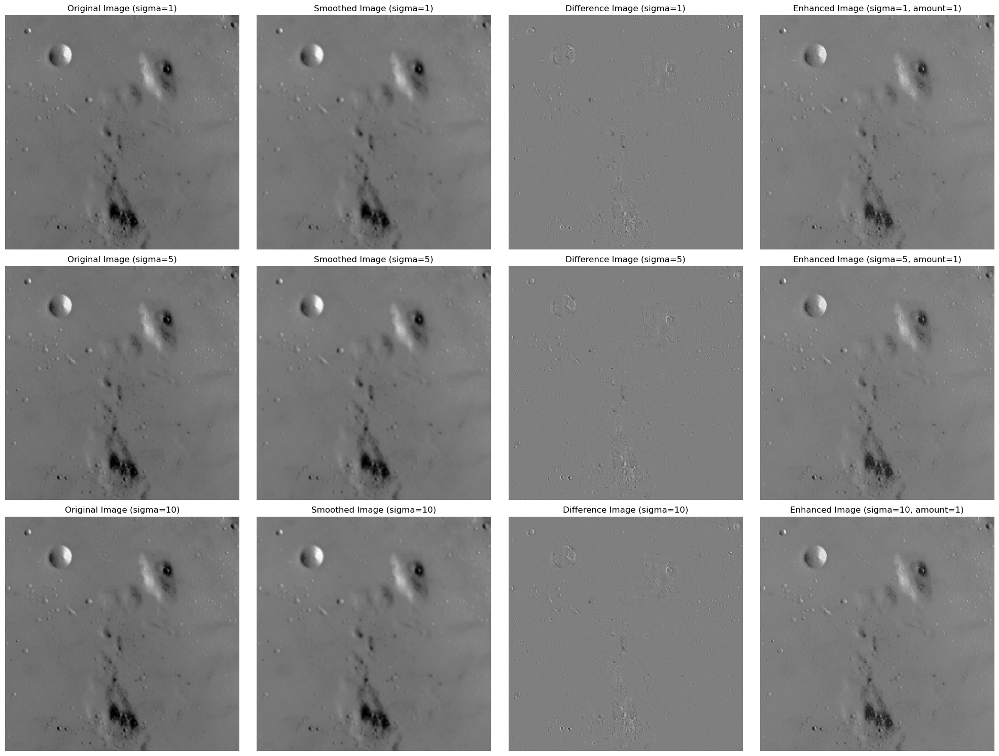

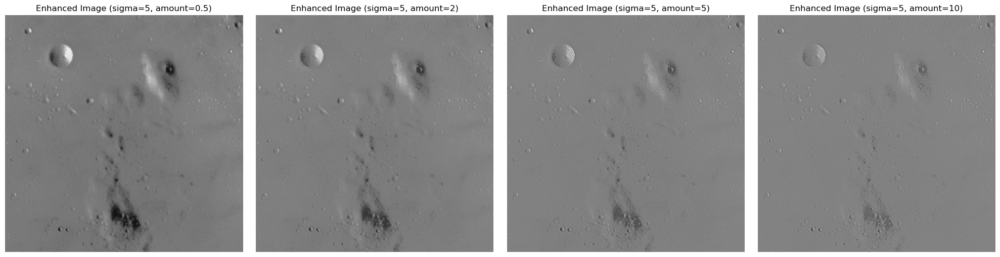

In [44]:
# solution
# Function to enhance the image
def enhance_image(img_moon, sigma, amount):
    smooth_image = gaussian(img_moon, sigma=sigma)
    difference_image = img_moon - moon_gaussian
    enhanced_image = img_moon + amount * difference_image
    return moon_gaussian, difference_image, enhanced_image

# Visualize different sigma values with amount=1
sigma_values = [1, 5, 10]
amount = 1

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))

for i, sigma in enumerate(sigma_values):
    moon_gaussian, difference_image, enhanced_image = enhance_image(img_moon, sigma, amount)
    
    axes[i, 0].imshow(img_moon, cmap='gray')
    axes[i, 0].set_title(f'Original Image (sigma={sigma})')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(moon_gaussian, cmap='gray')
    axes[i, 1].set_title(f'Smoothed Image (sigma={sigma})')
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(difference_image, cmap='gray')
    axes[i, 2].set_title(f'Difference Image (sigma={sigma})')
    axes[i, 2].axis('off')
    
    axes[i, 3].imshow(enhanced_image, cmap='gray')
    axes[i, 3].set_title(f'Enhanced Image (sigma={sigma}, amount={amount})')
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()

# Using the best sigma value (let's assume sigma=5 for this example), vary the amount value
best_sigma = 5
amount_values = [0.5, 2, 5, 10]

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

for i, amount in enumerate(amount_values):
    moon_gaussian, difference_image, enhanced_image = enhance_image(img_moon, best_sigma, amount)
    
    axes[i].imshow(enhanced_image, cmap='gray')
    axes[i].set_title(f'Enhanced Image (sigma={best_sigma}, amount={amount})')
    axes[i].axis('off')

plt.tight_layout()
plt.show()


# Edge Detection

### Exercise:
*   Read 'camera' image from the data module
*   Perform sobel, prewitt and roberts edge detection on the image
*   Visualize the original image, the edges and the edges superimposed on the original image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


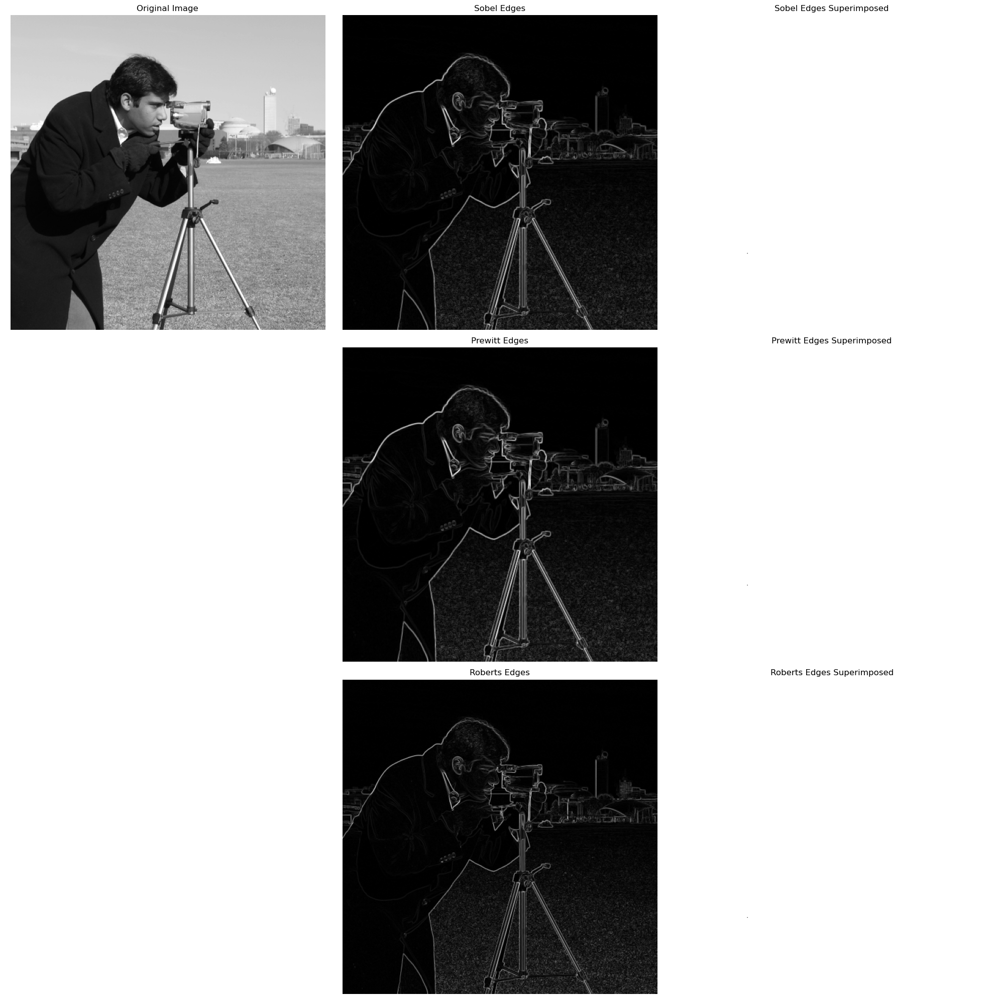

In [46]:
# solution
from skimage.filters import sobel, prewitt, roberts

camera = data.camera()

# Perform Sobel edge detection
edges_sobel = sobel(camera)

# Perform Prewitt edge detection
edges_prewitt = prewitt(camera)

# Perform Roberts edge detection
edges_roberts = roberts(camera)

# Superimpose edges on the original image
def superimpose_edges(camera, edges):
    return color.gray2rgb(camera) * (1 - edges[..., None])

# Superimposed images
super_sobel = superimpose_edges(camera, edges_sobel)
super_prewitt = superimpose_edges(camera, edges_prewitt)
super_roberts = superimpose_edges(camera, edges_roberts)

# Visualization
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 20))

# Original image
axes[0, 0].imshow(camera, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Sobel edges
axes[0, 1].imshow(edges_sobel, cmap='gray')
axes[0, 1].set_title('Sobel Edges')
axes[0, 1].axis('off')

# Sobel edges superimposed
axes[0, 2].imshow(super_sobel)
axes[0, 2].set_title('Sobel Edges Superimposed')
axes[0, 2].axis('off')

# Prewitt edges
axes[1, 1].imshow(edges_prewitt, cmap='gray')
axes[1, 1].set_title('Prewitt Edges')
axes[1, 1].axis('off')

# Prewitt edges superimposed
axes[1, 2].imshow(super_prewitt)
axes[1, 2].set_title('Prewitt Edges Superimposed')
axes[1, 2].axis('off')

# Roberts edges
axes[2, 1].imshow(edges_roberts, cmap='gray')
axes[2, 1].set_title('Roberts Edges')
axes[2, 1].axis('off')

# Roberts edges superimposed
axes[2, 2].imshow(super_roberts)
axes[2, 2].set_title('Roberts Edges Superimposed')
axes[2, 2].axis('off')

# Hide empty plots
axes[1, 0].axis('off')
axes[2, 0].axis('off')

plt.tight_layout()
plt.show()


*   What is the difference between each of the edge detectors?
*   What does you think is the limitation of each of the detector?



**Solution**

*(Double-click or enter to edit)*

Sobel is effective for high-frequency noise, Prewitt is effective for specific orientations, and Roberts is effective for high-frequency noise with specific orientations.

### Exercise: Canny edge detector
*   Read 'camera' image from the data module
*   Apply canny operator with default parameters
*   Apply canny by varying sigma=1, 3, 5, 10
*   Visualize the original image along with the edges detected using matplotlib.

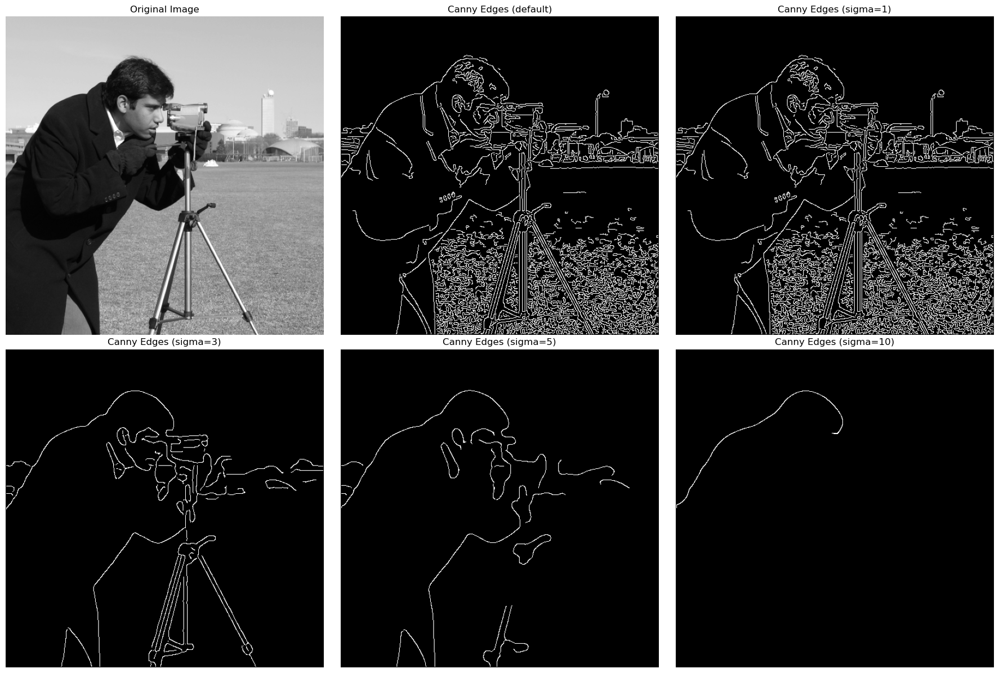

In [47]:
# solution
# Read the 'camera' image
image = data.camera()

# Apply Canny edge detection with default parameters
edges_default = feature.canny(image)

# Apply Canny edge detection with varying sigma values
sigma_values = [1, 3, 5, 10]
edges_sigma = [feature.canny(image, sigma=sigma) for sigma in sigma_values]

# Visualization
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))

# Original image
axes[0, 0].imshow(image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Canny edges with default parameters
axes[0, 1].imshow(edges_default, cmap='gray')
axes[0, 1].set_title('Canny Edges (default)')
axes[0, 1].axis('off')

# Canny edges with sigma=1
axes[0, 2].imshow(edges_sigma[0], cmap='gray')
axes[0, 2].set_title('Canny Edges (sigma=1)')
axes[0, 2].axis('off')

# Canny edges with sigma=3
axes[1, 0].imshow(edges_sigma[1], cmap='gray')
axes[1, 0].set_title('Canny Edges (sigma=3)')
axes[1, 0].axis('off')

# Canny edges with sigma=5
axes[1, 1].imshow(edges_sigma[2], cmap='gray')
axes[1, 1].set_title('Canny Edges (sigma=5)')
axes[1, 1].axis('off')

# Canny edges with sigma=10
axes[1, 2].imshow(edges_sigma[3], cmap='gray')
axes[1, 2].set_title('Canny Edges (sigma=10)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


*   What is the effect of varying the sigma values on the edges?
*   What do the high threshold and low threshold parameters denote?


**Solution**

*(Double-click or enter to edit)*

Increasing the sigma values will make the details disappear

*   What is the algorithm behind the Canny operator?


**Solution**

*(Double-click or enter to edit)*

the Canny edge detection algorithm is a multi-stage process that aims to detect significant edges in an image while minimizing noise and false detections. 